# Domain coloring - Visualizing complex functions

In [1]:
import os
import sys
import numpy as np

import seaborn as sns
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.gridspec as gridspec
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import hsv_to_rgb
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [2]:
# Various size parameters for plotting
axistitlesize = 25
axisticksize = 17
axislabelsize = 26
axislegendsize = 23
axistextsize = 20
axiscbarfontsize = 15

In [3]:
out = './output/'

In [4]:
cmaps = ['viridis', 'plasma', 'inferno', 'magma', 'cividis']

## Domain coloring basics

In [5]:
def create_domain(xy, N):
    """
    Create coordinate system for an arbitrary complex domain,
    """
    X = np.linspace(-xy, xy, N)
    Y = np.linspace(-xy, xy, N)
    X, Y = np.meshgrid(X, Y)
    
    return X + 1j*Y[::-1]

def normalize(arr):
    """
    Normalize data based on their min/max values.
    """
    return (arr - np.min(arr)) / (np.max(arr) - np.min(arr))

def corr_singular(z):
    """
    Handle singular expressions
    """
    r = np.finfo(np.float64).eps
    return np.nan_to_num(z, nan=r, neginf=r, posinf=r)

def calc_params(zz):
    """
    Calculate the plotted parameters used to visualize the "4D depth"
    of an arbitrary complex function in 2D.
    """
    # Length of z
    r = corr_singular(np.abs(zz))
    # Argument of z
    arg = normalize(np.angle(zz) % (2 * np.pi))
    # Create logarithmic mask of z
    mask = normalize(np.log2(r) % 1)
    
    return arg, mask

### Define complex functions

In [6]:
fs = {
    # Basic functions
    # Parameters:
    # xy, f
    'f_p2' : [1.5, (lambda z : z**2)],
    'f_p3' : [1.5, (lambda z : z**3)],
    'f_p5m1' : [1.5, (lambda z : z**5 - 1)],
    'f_log' : [3, (lambda z : np.log(z))],
    'f_sin' : [3, (lambda z : np.sin(z))],
    'f_sinz' : [1.1, (lambda z : np.sin(1/z))],

    # Functions that look interesting
    'f_nice_1' : [2, (lambda z : (z**2 - 1j) / (2*z**2 + 2j))],
    'f_nice_2' : [3, (lambda z : (z - 2)**2 * (z + 1 - 2j) * (z + 2 - 2j) / z**3)],
    'f_nice_3' : [3, (lambda z : ((z**2 - 1) * (z - 2 - 1j)**2) / (z**2 + 2 + 2j))],
}

### Calculate function and other parameters on an arbitrary domain

In [11]:
# Choose a function
f = fs['f_p5m1']

# Create domain for plot
z = create_domain(xy=f[0], N=2000)
# Calculate function values
zz = f[1](z)
# Correct singularities (if exist)
zz = corr_singular(zz)

In [12]:
arg, mask = calc_params(zz)

### Plot components and final masked image

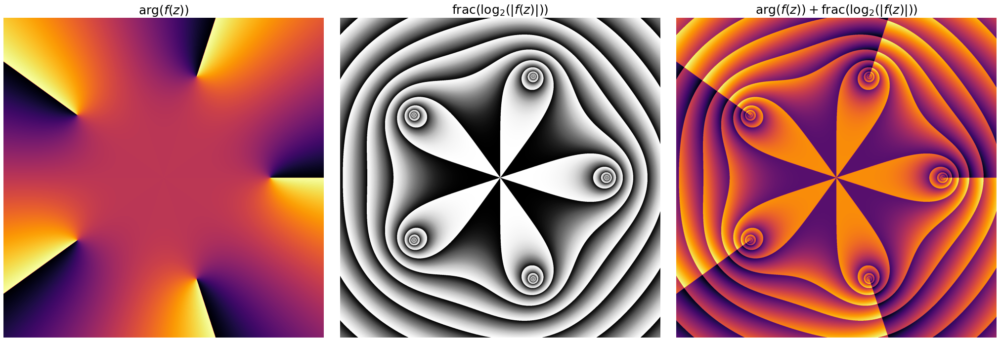

In [13]:
nrows = 1
ncols = 3
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*12,nrows*12))
fig.subplots_adjust(wspace=0.05)

ax = axes[0]
ax.imshow(arg, cmap=cmaps[2])
ax.set_title('$\mathrm{arg} \\left( f(z) \\right)$',
             fontsize=axistitlesize)

ax = axes[1]
ax.imshow(mask, cmap='Greys_r')
ax.set_title('$\mathrm{frac} \\left( \log_{2} (|f(z)|) \\right)$',
             fontsize=axistitlesize)

ax = axes[2]
ax.imshow(arg + mask, cmap=cmaps[2])
ax.set_title('$\mathrm{arg} \\left( f(z) \\right) + \mathrm{frac} \\left( \log_{2} (|f(z)|) \\right)$',
             fontsize=axistitlesize)

for ax in axes:
    ax.set_aspect('equal')
    ax.axis('off')

plt.show()

## Create gridlines

In [51]:
def create_grid(zz, thres):
    
    # Create base grid
    x = zz.real
    y = zz.imag
    g = lambda x, y : (y%1 - 0.5) * (x%1 - 0.5)
    grid = g(x, y) > 0
    
    # Other method for grid creation
    '''grid = np.zeros_like(zz.real)
    for zz_c in [zz.real, zz.imag]:
        g = np.abs((np.abs(zz_c) % 1) - 0.5)
        g[g < thres] = 0
        g[g >= thres] = 1
        grid += g
    grid[grid == 2] = 1
    grid = np.abs(grid - 1)'''
    
    return grid

In [52]:
grid = create_grid(zz, thres=0.48)

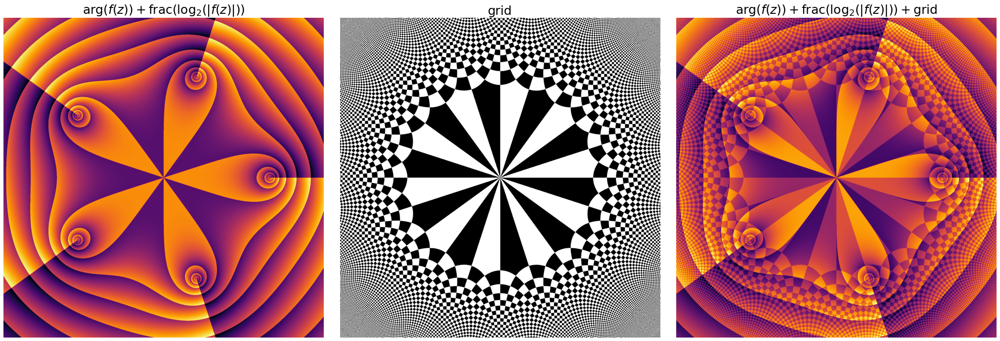

In [53]:
nrows = 1
ncols = 3
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*12,nrows*12))
fig.subplots_adjust(wspace=0.05)

ax = axes[0]
ax.imshow(arg + mask, cmap=cmaps[2])
ax.set_title('$\mathrm{arg} \\left( f(z) \\right) + \mathrm{frac} \\left( \log_{2} (|f(z)|) \\right)$',
             fontsize=axistitlesize)

ax = axes[1]
ax.imshow(grid, cmap='Greys_r', interpolation='bilinear')
ax.set_title('grid',
             fontsize=axistitlesize)

ax = axes[2]
ax.imshow(arg + mask + grid*0.5, cmap=cmaps[2])
#ax.imshow(grid, cmap='Greys_r', alpha=0.1)
ax.set_title('$\mathrm{arg} \\left( f(z) \\right) + \mathrm{frac} \\left( \log_{2} (|f(z)|) \\right) + \mathrm{grid}$',
             fontsize=axistitlesize)

for ax in axes:
    ax.set_aspect('equal')
    ax.axis('off')

plt.show()

## Final image with perceptually uniform colormaps

*Or more like perceptually uniform colormaps, which are implemented in `matplotlib`

In [15]:
def plot_collection(arg, mask, grid,
                    grid_alpha=0.5):
    plt.figure(figsize=(15*3,15*2),
               facecolor='ghostwhite')
    gs = gridspec.GridSpec(2, 6)
    gs.update(hspace=0.05, wspace=0.05)

    ax1 = plt.subplot(gs[0, :2])
    ax2 = plt.subplot(gs[0, 2:4])
    ax3 = plt.subplot(gs[0, 4:6])
    ax4 = plt.subplot(gs[1, 1:3])
    ax5 = plt.subplot(gs[1, 3:5])
    axes = [ax1, ax2, ax3, ax4, ax5]

    for i, cmap in enumerate(cmaps):
        axes[i].set_aspect('equal')
        axes[i].axis('off')

        im = axes[i].imshow(arg + mask + grid*grid_alpha, cmap=cmap)

    plt.show()

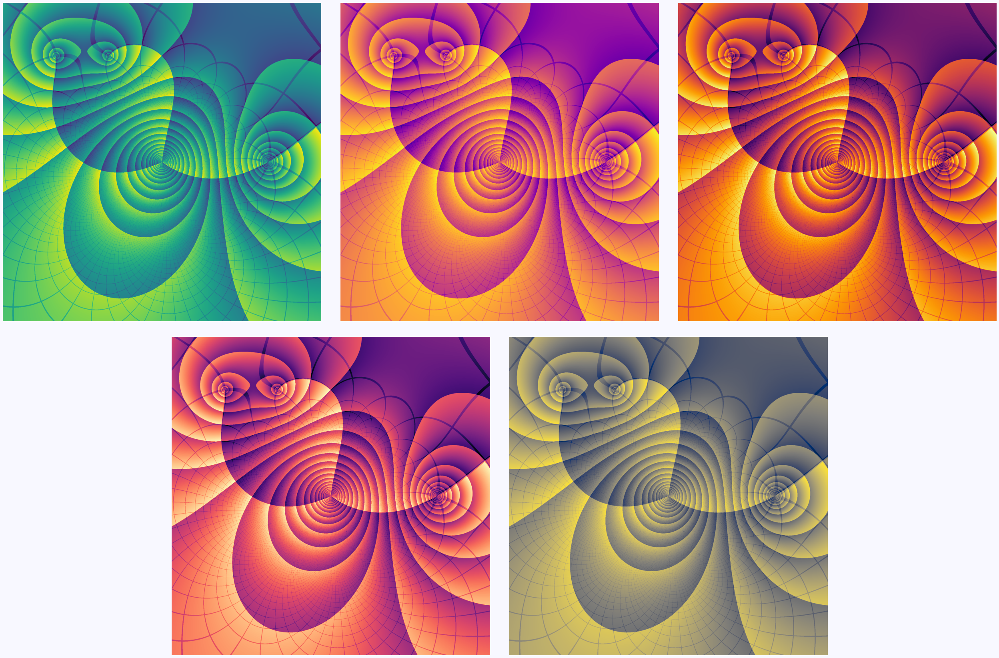

In [16]:
plot_collection(arg=arg, mask=mask, grid=grid, grid_alpha=0.4)

### Save all function plot

In [72]:
def save_plots(fs, grid_alpha,
               colormaps=None):
    """
    
    Parameters
    ----------
    fs : dict
        List of lambda function to be plotted
        
    grid_alpha : float in [0, 1]
        Alpha of the coordinate lines on the image
    """ 
    for i, (fn, fl) in enumerate(fs.items()):
        # Create domain for plot
        z = create_domain(xy=fl[0], N=2000)
        # Calculate function values
        zz = fl[1](z)
        # Correct singularities (if exist)
        zz = corr_singular(zz)
        # Calculate plotted parameters
        arg, mask = calc_params(zz)
        # Create coordinate grid
        grid = create_grid(zz, thres=0.48)
        
        # Save image
        fig, axes = plt.subplots(figsize=(12,12))
        cmap = colormaps[i] if colormaps is not None else np.random.choice(cmaps)
        plt.imsave(out + '{0}_alpha-{1}.png'.format(fn, grid_alpha),
                   arr=(arg + mask + grid*grid_alpha),
                   cmap=cmap,
                   dpi=200)
        plt.close()

In [74]:
colormaps = [
    cmaps[2], #f_p2
    cmaps[0], #f_p3
    cmaps[3], #f_p5m1
    cmaps[4], #f_log
    cmaps[3], #f_sin
    cmaps[3], #f_sinz

    cmaps[2], #f_nice_1
    cmaps[2], #f_nice_2
    cmaps[3], #f_nice_3
]

save_plots(fs=fs, grid_alpha=0.4,
           colormaps=colormaps)

<ipython-input-58-4c27f522797b>:10: RuntimeWarning: overflow encountered in sin
  'f_sinz' : [1.1, (lambda z : np.sin(1/z))],


## Domain coloring with `HSL` color model

(Currently thrash...)

In [15]:
def create_HSL_model(zz):
    """
    Create the HSV color model for the function domain that will be plotted.
    
    H, S, L parameters from here:
    https://en.wikipedia.org/wiki/Domain_coloring
    
    Converting HSL to RGB:
    https://en.wikipedia.org/wiki/HSL_and_HSV#HSL_to_RGB
    """
    # Create HSL model
    H = np.angle(zz)
    S = np.ones_like(H)
    L = 2 / np.pi * np.arctan(np.abs(zz))

    ## Convert it to RGB
    # 1. Calculate RGB parameters
    C = (1 - np.abs(2*L - 1)) * S       # Chroma
    H_ = np.rad2deg(H) / 60
    X = C * (1 - np.abs((H_ % 2) - 1))  # Some intermediate value
    m = L - C/2                         # Some color equalization
    zero = np.zeros_like(H_)
    
    # 2. Calculate RGB values
    R = np.zeros_like(H_)
    G = np.zeros_like(H_)
    B = np.zeros_like(H_)
    
    # Here
    #   - 0: C
    #   - 1: X
    #   - 2: zeros
    p = [C, X, zero]
    rgb_values = [
        [0, 1, 2],  # if 0 < H_ < 1
        [1, 0, 2],  # if 1 < H_ < 2
        [2, 0, 1],  # if 2 < H_ < 3
        [2, 1, 0],  # if 3 < H_ < 4
        [1, 2, 0],  # if 4 < H_ < 5
        [0, 2, 1],  # if 5 < H_ < 6
    ]
    for lim in range(0, 6):
        for rgb, val in zip([R,G,B], [p[r] for r in rgb_values[lim]]):
            mask = (lim <= H_) + (H_ < lim+1)
            rgb[mask] = val[mask]
    
    # 3. Create RGB table
    rgb = np.dstack((R+m,G+m,B+m))
    rgb[rgb < 0] = 0
    
    return rgb

In [16]:
# Create HSL map and convert it to RGB
rgb = create_HSL_model(zz=zz)

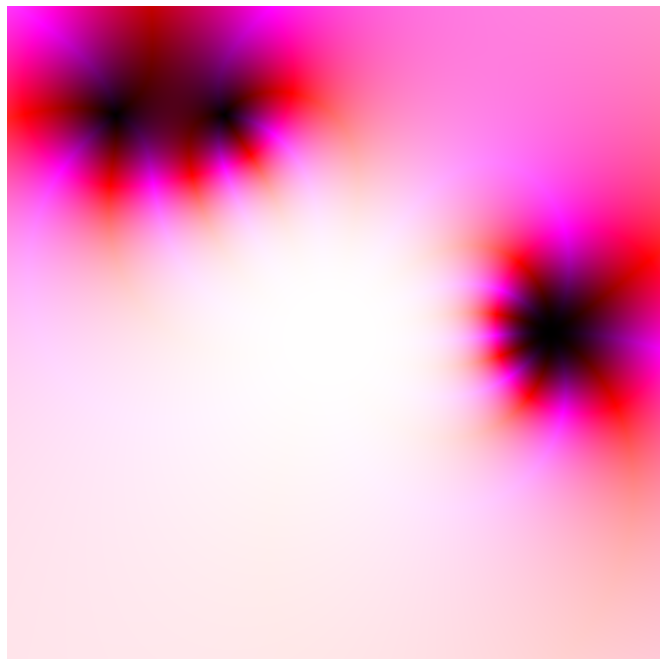

In [17]:
fig, axes = plt.subplots(figsize=(12,12))
axes.set_aspect('equal')
axes.axis('off')
axes.invert_yaxis()

axes.imshow(rgb)

plt.show()

## Domain coloring with `HSV` color model

(`HSV` values are not mine.)

In [18]:
def create_HSV_model(zz):
    """
    Create the HSV color model for the function domain that will be plotted
    
    H, S, V parameters from here:
    https://github.com/hernanat/dcolor/blob/master/dcolor.py
    """
    # Hue determined by arg(z)
    H = normalize(np.angle(zz) % (2 * np.pi))
    r = corr_singular(np.log2(1 + np.abs(zz)))
    S = (1 + np.abs(np.sin(2 * np.pi * r))) / 2
    V = (1 + np.abs(np.cos(2 * np.pi * r))) / 2

    return H,S,V

In [19]:
# Create HSV model
H,S,V = create_HSV_model(zz)
# Convert to RGB
rgb = hsv_to_rgb(np.dstack((H,S,V)))

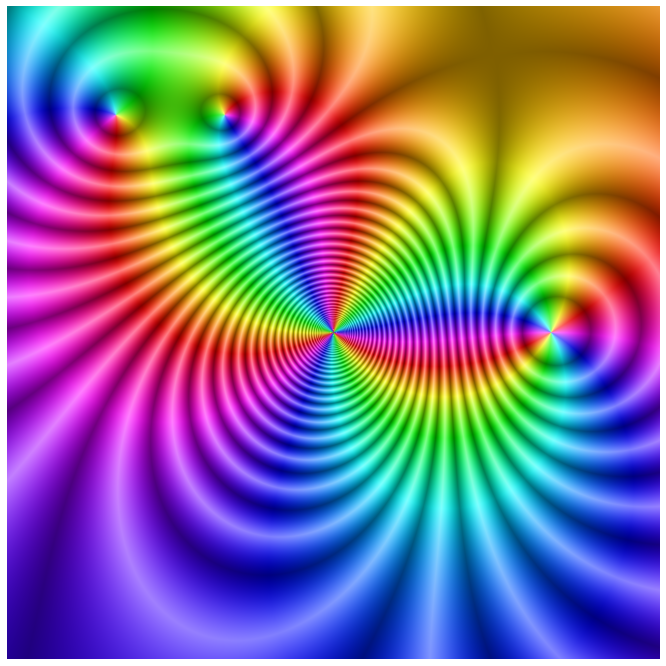

In [20]:
fig, axes = plt.subplots(figsize=(12,12))
axes.set_aspect('equal')
axes.axis('off')
axes.invert_yaxis()

axes.imshow(rgb)

plt.show()

## Julia sets

In [21]:
def f(zz, c):
    return zz**2 + c

In [22]:
def iterate(zz, c, N=5):

    zz = f(zz, c)
    zz = corr_singular(zz)
    
    if N > 1:
        return iterate(zz, c, N-1)
    else:
        return zz

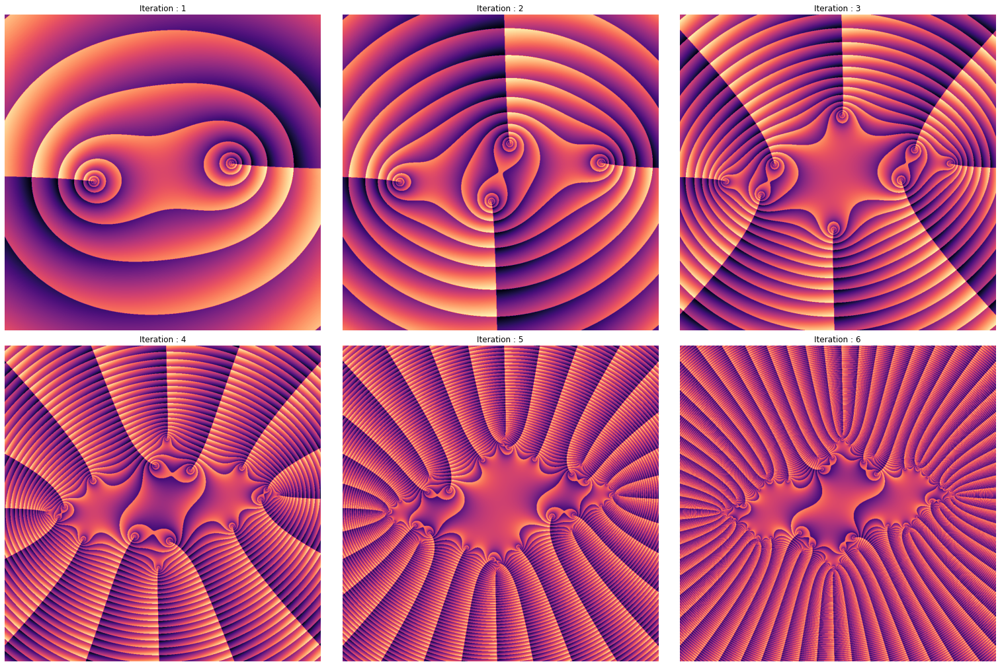

In [26]:
nrows = 2
ncols = 3
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*9,nrows*9))
fig.subplots_adjust(hspace=0.05, wspace=0.05)

for i in range(nrows):
    for j in range(ncols):
        ax = axes[i,j]
        ax.set_aspect('equal')
        ax.axis('off')

        it = (i*ncols + j) + 1
        zz = create_domain(xy=2, N=1000)
        zz = iterate(zz, c=(-0.75 - 0.2j), N=it)
        arg, mask = calc_params(zz)
        
        ax.set_title('Iteration : {0}'.format(it))
        
        ax.imshow(arg + mask, cmap=cmaps[3])

plt.show()

<ipython-input-21-dbbe8f078e88>:2: RuntimeWarning: overflow encountered in square
  return zz**2 + c
<ipython-input-21-dbbe8f078e88>:2: RuntimeWarning: invalid value encountered in square
  return zz**2 + c


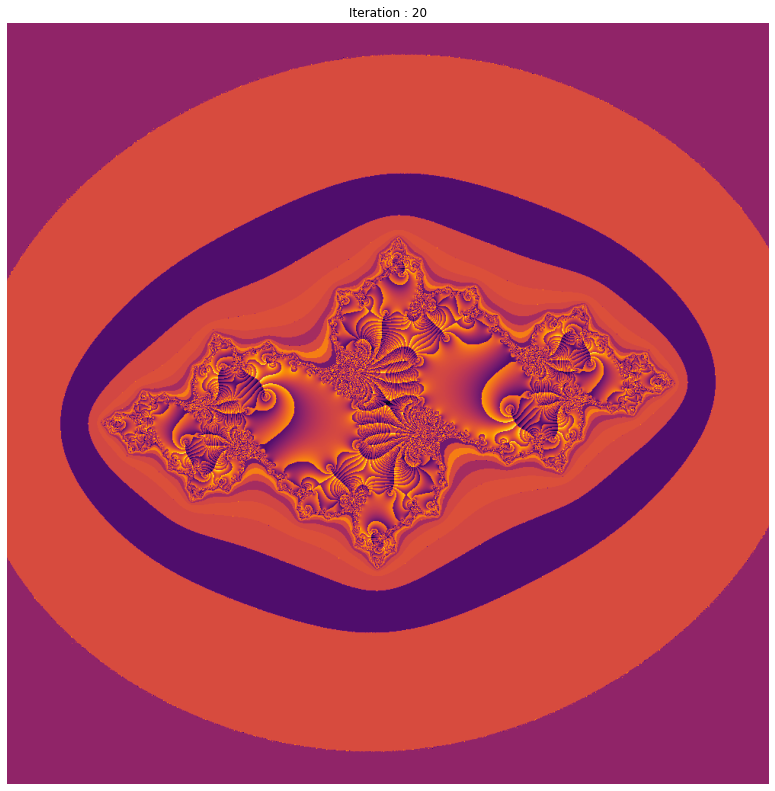

In [31]:
fig, axes = plt.subplots(figsize=(14,14))

axes.set_aspect('equal')
axes.axis('off')

it = 20
zz = create_domain(xy=2, N=1000)
zz = iterate(zz, c=(-0.75 - 0.2j), N=it)
arg, mask = calc_params(zz)

axes.imshow(arg + mask, cmap=cmaps[2])

axes.set_title('Iteration : {0}'.format(it))

plt.show()